In [188]:
import pandas as pd

In [189]:
df = pd.read_csv("rolling_stones_spotify.csv", parse_dates = ["release_date"])

In [190]:
df.head()

,Unnamed: 0,name,album,release_date,track_number,id,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms
0,0,Concert Intro Music - Live,Licked Live In NYC,2022-06-10,1,2IEkywLJ4ykbhi1yRQvmsT,spotify:track:2IEkywLJ4ykbhi1yRQvmsT,0.0824,0.463,0.993,0.996000,0.932,-12.913,0.1100,118.001,0.0302,33,48640
1,1,Street Fighting Man - Live,Licked Live In NYC,2022-06-10,2,6GVgVJBKkGJoRfarYRvGTU,spotify:track:6GVgVJBKkGJoRfarYRvGTU,0.4370,0.326,0.965,0.233000,0.961,-4.803,0.0759,131.455,0.3180,34,253173
2,2,Start Me Up - Live,Licked Live In NYC,2022-06-10,3,1Lu761pZ0dBTGpzxaQoZNW,spotify:track:1Lu761pZ0dBTGpzxaQoZNW,0.4160,0.386,0.969,0.400000,0.956,-4.936,0.1150,130.066,0.3130,34,263160
3,3,If You Can't Rock Me - Live,Licked Live In NYC,2022-06-10,4,1agTQzOTUnGNggyckEqiDH,spotify:track:1agTQzOTUnGNggyckEqiDH,0.5670,0.369,0.985,0.000107,0.895,-5.535,0.1930,132.994,0.1470,32,305880
4,4,Don’t Stop - Live,Licked Live In NYC,2022-06-10,5,7piGJR8YndQBQWVXv6KtQw,spotify:track:7piGJR8YndQBQWVXv6KtQw,0.4000,0.303,0.969,0.055900,0.966,-5.098,0.0930,130.533,0.2060,32,305106


    dropping "Unnamed: 0: redundant index column as well as id and url

In [191]:
df.drop(["Unnamed: 0", "id", "uri"], axis = 1 ,inplace = True)

    looking for missing values

In [192]:
df.isnull().sum()

name                0
album               0
release_date        0
track_number        0
acousticness        0
danceability        0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
duration_ms         0
dtype: int64

    checking data types

In [193]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1610 entries, 0 to 1609
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   name              1610 non-null   object        
 1   album             1610 non-null   object        
 2   release_date      1610 non-null   datetime64[ns]
 3   track_number      1610 non-null   int64         
 4   acousticness      1610 non-null   float64       
 5   danceability      1610 non-null   float64       
 6   energy            1610 non-null   float64       
 7   instrumentalness  1610 non-null   float64       
 8   liveness          1610 non-null   float64       
 9   loudness          1610 non-null   float64       
 10  speechiness       1610 non-null   float64       
 11  tempo             1610 non-null   float64       
 12  valence           1610 non-null   float64       
 13  popularity        1610 non-null   int64         
 14  duration_ms       1610 n

    using ydata profiler to take a general look at the data

In [194]:
# you will need this package
#!pip install ydata-profiling

In [195]:
from ydata_profiling import ProfileReport

In [196]:
profile = ProfileReport(df, title = "ChohortProfile") 

In [197]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

    cleaning the name and album columns from any special carachters

In [198]:
df[["name","album"]].apply(lambda x : sum([not i.isalnum for i in x ]))

name     0
album    0
dtype: int64

There are no special charachters in these two columns

    Looking for duplicated values

In [199]:
df.name.nunique() , df.album.nunique()

(954, 90)

In [200]:
df.name.duplicated().sum()

656

In [201]:
df[df.name.duplicated()].head()

,name,album,release_date,track_number,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms
92,Start Me Up - Remastered 2021,Tattoo You,2021-10-22,1,0.0302,0.555,0.956,0.3670,0.0753,-2.147,0.0577,121.752,0.933,12,214173
93,Hang Fire - Remastered 2021,Tattoo You,2021-10-22,2,0.0136,0.421,0.927,0.0797,0.2640,-1.734,0.0345,151.096,0.922,11,141626
94,Slave - Remastered 2021,Tattoo You,2021-10-22,3,0.1300,0.558,0.898,0.3060,0.0562,-4.314,0.0515,133.338,0.853,11,392426
95,Little T&A - Remastered 2021,Tattoo You,2021-10-22,4,0.1560,0.497,0.953,0.0429,0.6670,-1.978,0.0328,135.453,0.801,13,204440
96,Black Limousine - Remastered 2021,Tattoo You,2021-10-22,5,0.1220,0.480,0.934,0.1980,0.7010,-1.382,0.0715,108.894,0.825,9,214893


It makes sense for album names to appear as duplicated because there are several songs (observations) in each album <br>

but lets make sure there are not actual duplicated rows by combining the song name and album name

    removing white spaces and dashes for easier comparision

In [202]:
df[["name","album"]] = df[["name","album"]].apply(lambda x : x.astype(str).str.replace(" ","").str.replace("-",""))

In [203]:
df["full_name"] = df["name"] +df["album"]

In [204]:
df.full_name.duplicated().sum()

102

        slicing the dataframe to move the full_name column to the front 

In [205]:
df = df[["full_name",'name', 'album', 'release_date', 'track_number', 'acousticness',
       'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness',
       'speechiness', 'tempo', 'valence', 'popularity', 'duration_ms' ]]

    taking a look at some pairs of duplicated rows

In [206]:
df[df.full_name.duplicated(keep = False)].sort_values("full_name")

,full_name,name,album,release_date,track_number,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms
315,(ICan'tGetNo)SatisfactionLiveVoodooLoungeUncut...,(ICan'tGetNo)SatisfactionLive,VoodooLoungeUncut(Live),2018-11-16,8,0.2690,0.312,0.961,0.261000,0.9640,-6.426,0.1290,150.904,0.345,9,409792
287,(ICan'tGetNo)SatisfactionLiveVoodooLoungeUncut...,(ICan'tGetNo)SatisfactionLive,VoodooLoungeUncut(Live),2018-11-16,8,0.2690,0.312,0.961,0.261000,0.9640,-6.426,0.1290,150.904,0.345,16,409792
1338,AllSoldOutBetweenTheButtons,AllSoldOut,BetweenTheButtons,1967-01-20,8,0.5680,0.497,0.751,0.000227,0.2170,-8.733,0.0444,112.025,0.734,0,197306
1361,AllSoldOutBetweenTheButtons,AllSoldOut,BetweenTheButtons,1967-01-20,7,0.4400,0.692,0.681,0.000013,0.0978,-9.265,0.0348,117.518,0.840,24,137666
317,AngieLiveVoodooLoungeUncut(Live),AngieLive,VoodooLoungeUncut(Live),2018-11-16,10,0.5970,0.361,0.600,0.000079,0.9200,-11.572,0.0833,151.516,0.387,10,254474
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,YouGotMeRockingLiveVoodooLoungeUncut(Live),YouGotMeRockingLive,VoodooLoungeUncut(Live),2018-11-16,4,0.0977,0.455,0.916,0.082900,0.9430,-8.238,0.0878,131.181,0.320,16,235624
1245,YouGotTheSilverLetItBleed,YouGotTheSilver,LetItBleed,1969-12-05,7,0.7410,0.477,0.378,0.023700,0.1390,-11.108,0.0422,139.450,0.551,11,170400
1254,YouGotTheSilverLetItBleed,YouGotTheSilver,LetItBleed,1969-12-05,7,0.7560,0.471,0.371,0.027200,0.1370,-11.123,0.0423,143.892,0.543,42,170373
923,YouWinAgainSomeGirls(DeluxeVersion),YouWinAgain,SomeGirls(DeluxeVersion),1978-06-09,11,0.0962,0.403,0.650,0.002930,0.2480,-4.279,0.0269,83.957,0.530,17,180280


    dropping the duplicated rows

In [207]:
df.drop_duplicates("full_name", inplace = True)

C:\Users\Acer\AppData\Local\Temp\ipykernel_11852\1330039937.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop_duplicates("full_name", inplace = True)


In [208]:
df.full_name.duplicated().sum()

0


---


## Visualization which two albums to recommend based on num of popular songs

In [209]:
df.groupby("album").sum().sort_values("popularity", ascending = False)

C:\Users\Acer\AppData\Local\Temp\ipykernel_11852\4148668566.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby("album").sum().sort_values("popularity", ascending = False)


,track_number,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms
album,,,,,,,,,,,,
Honk(Deluxe),1128,9.671574,25.707,38.661,6.725271,14.8288,-236.324,2.2572,5715.625,31.3290,1232,12059243
TattooYou(SuperDeluxe),462,11.012900,20.050,41.727,16.109790,28.9255,-221.739,4.1007,5677.156,26.6816,1008,12467581
GoatsHeadSoup(Deluxe),253,6.662140,15.797,30.950,9.265615,14.7189,-194.461,2.0204,4583.429,23.7040,891,10391014
ExileOnMainStreet(DeluxeVersion),226,11.502060,12.521,22.658,10.443289,9.0773,-149.671,1.1619,3448.722,20.1430,839,6493641
ExileOnMainStreet(2010ReMastered),171,8.970900,8.891,14.536,9.509842,6.2390,-98.072,0.7338,2157.480,13.0550,795,4026860
...,...,...,...,...,...,...,...,...,...,...,...,...
GetYerYaYasOut,55,1.741007,4.561,7.358,3.578600,8.6420,-106.339,0.4994,1285.969,6.8630,56,2862462
Now!,78,3.219600,7.112,8.246,2.251848,2.2526,-124.523,0.6227,1597.333,9.2760,44,2144368
OutOfOurHeads(UKSequence),78,1.623200,6.755,7.931,1.915421,2.9387,-109.754,0.4620,1581.611,8.7420,31,1763477


In [210]:
df1  = df.groupby("album").sum().sort_values("popularity", ascending = False)

C:\Users\Acer\AppData\Local\Temp\ipykernel_11852\1948433258.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df1  = df.groupby("album").sum().sort_values("popularity", ascending = False)


In [211]:
import matplotlib.pyplot as plt
import seaborn as sns

In [212]:
%matplotlib inline

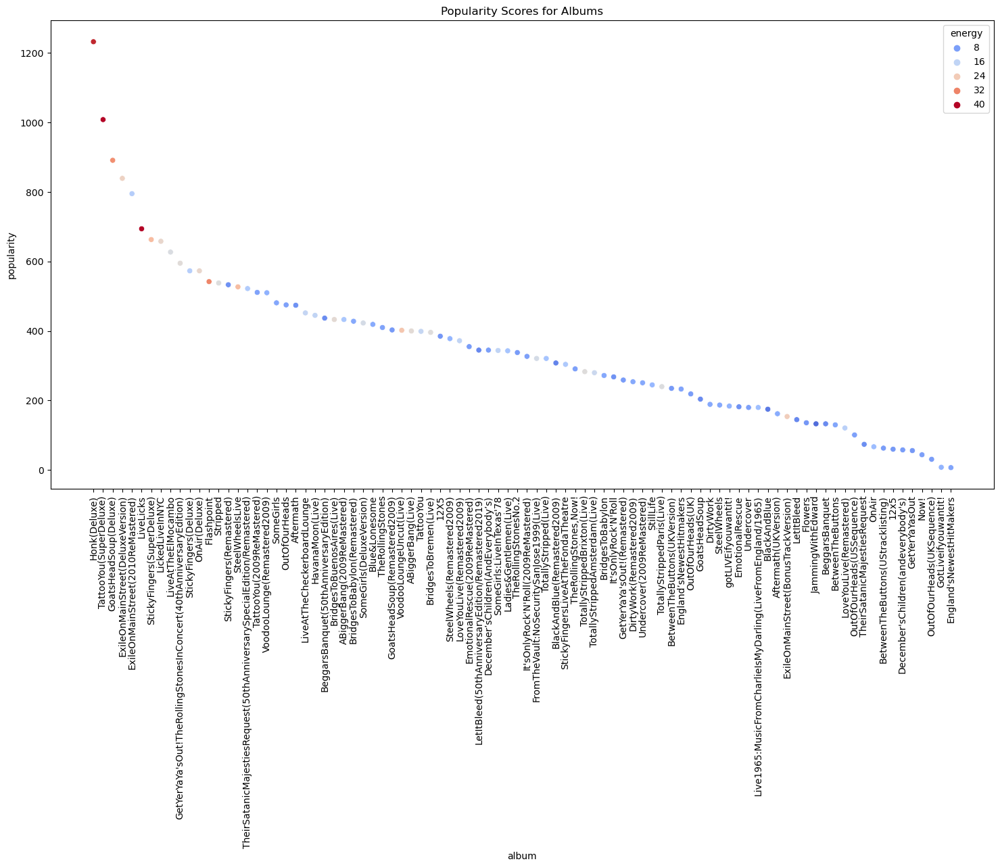

In [213]:
plt.figure(figsize=(18, 9))
sns.scatterplot(data = df1, x = "album", y = "popularity", hue = "energy", hue_norm = (0,40), palette = "coolwarm")
#sns.diverging_palette(145, 300, s=60, as_cmap=True)
plt.xticks(rotation=90)
plt.title('Popularity Scores for Albums')
plt.show();

### Feature Dive

In [214]:
df.columns

Index(['full_name', 'name', 'album', 'release_date', 'track_number',
       'acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity',
       'duration_ms'],
      dtype='object')

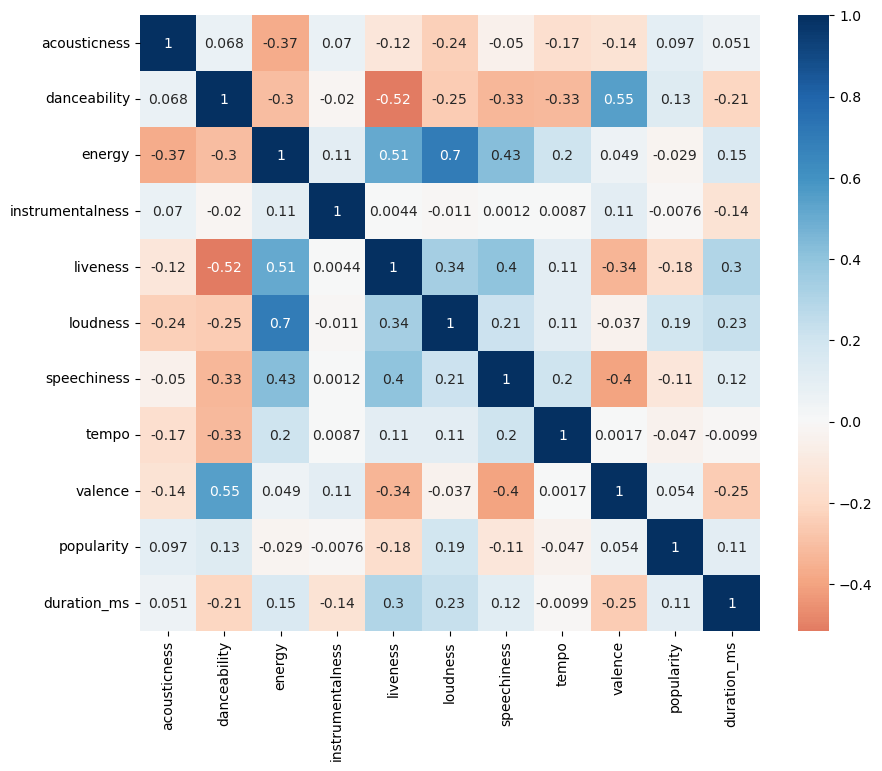

In [215]:
plt.figure(figsize = [10, 8])
sns.heatmap(df[['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity',
       'duration_ms']].corr(), annot = True ,cmap= "RdBu", center = 0)
plt.show()